85,828,887 total parameters.
85,828,887 training parameters.
hparams ['datapath', 'train_outpath', 'test_path', 'main_param_path', 'test_outpath', 'model_path', 'dataset', 'use_wandb', 'random_rot', 'AugMix', 'use_data_moments', 'use_scheduler', 'balance_weight', 'cyanos_only', 'architecture', 'batch_size', 'gamma', 'max_epochs', 'swa', 'loss', 'lr', 'lr_factor', 'train_first', 'no_gpu', 'ensemble', 'TTA', 'testing', 'finetune']
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reached
max images reach

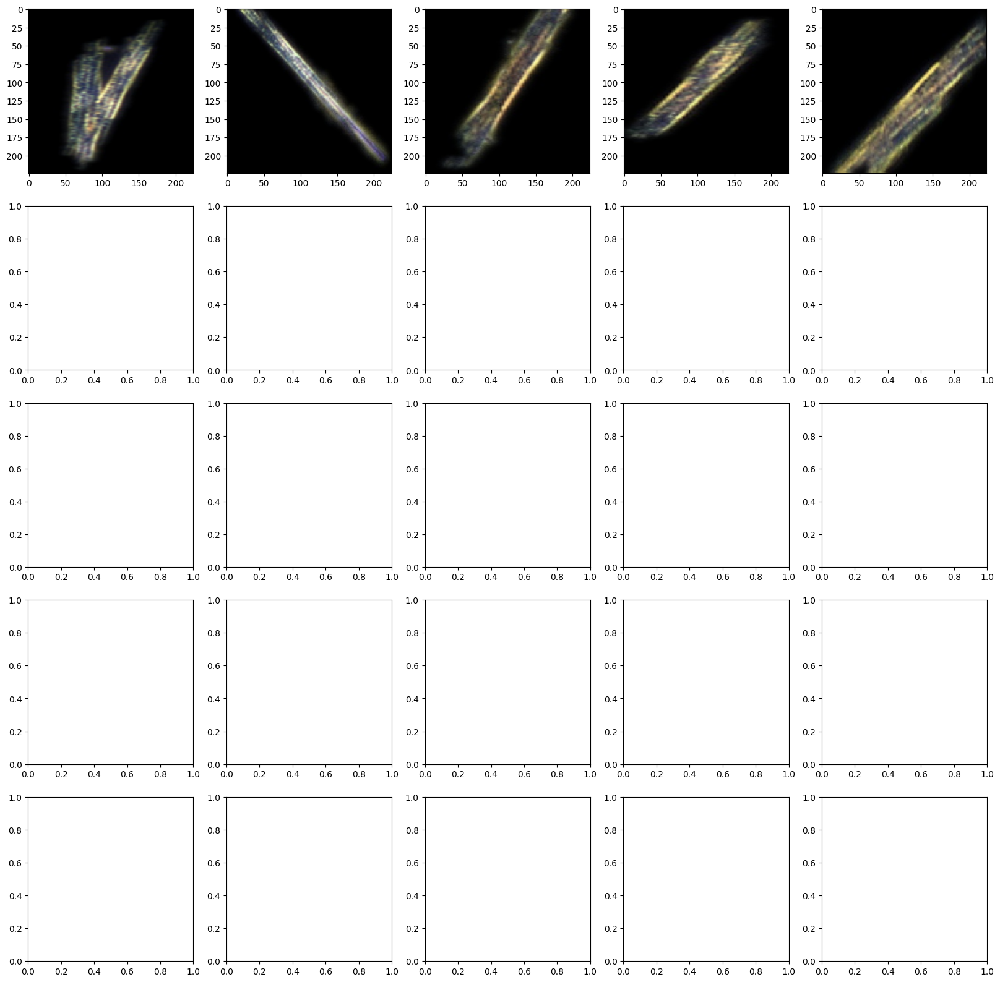

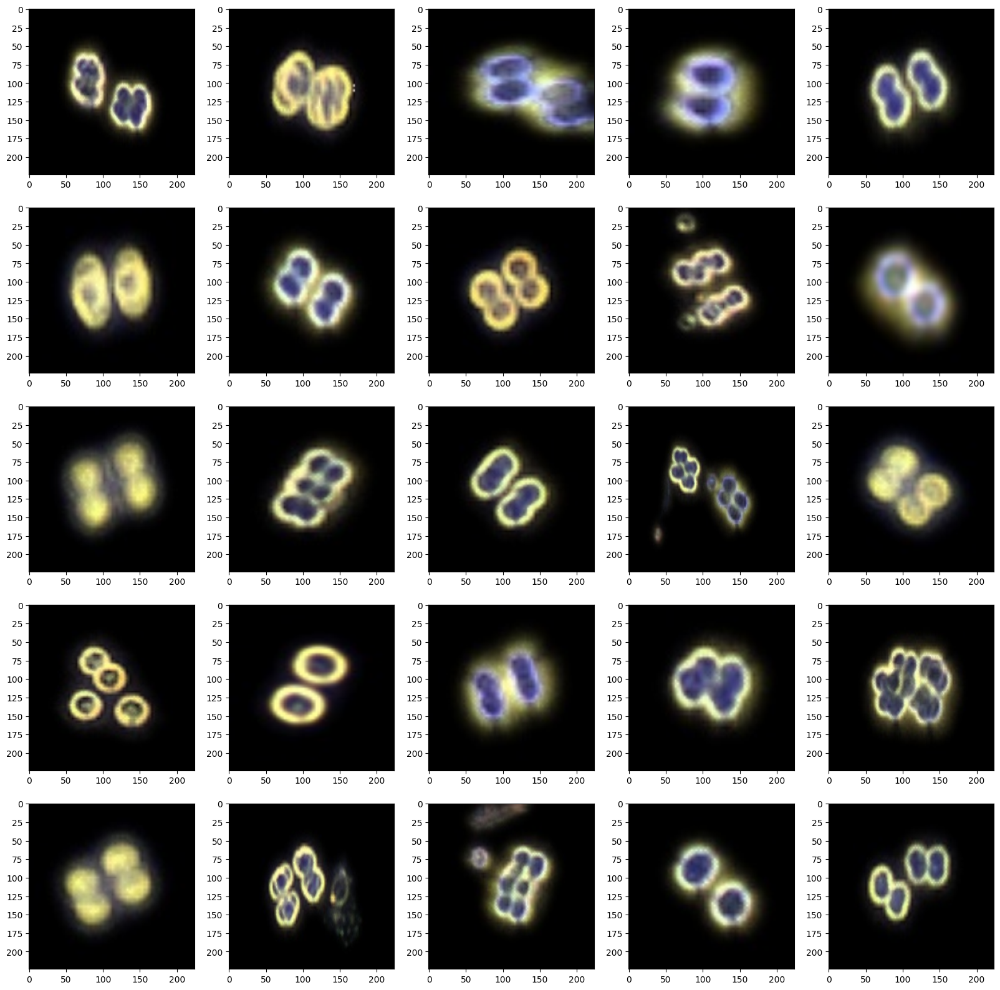

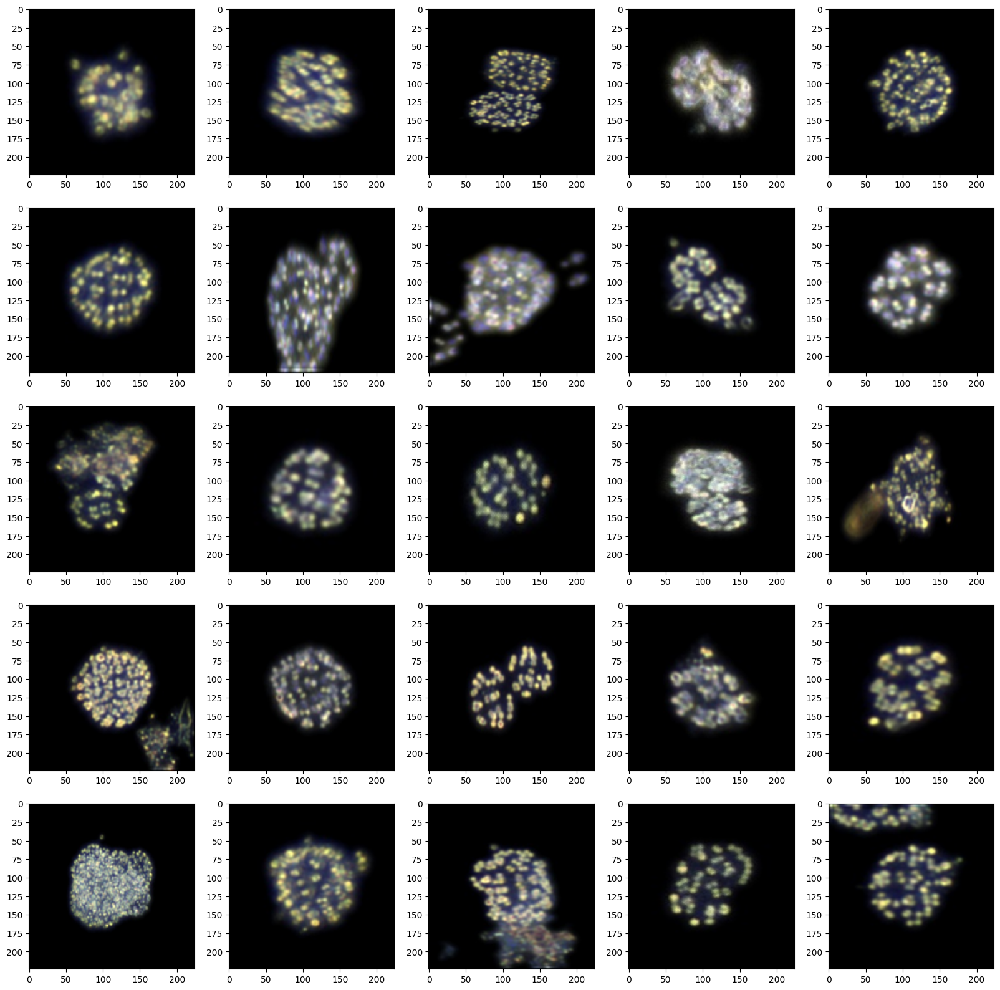

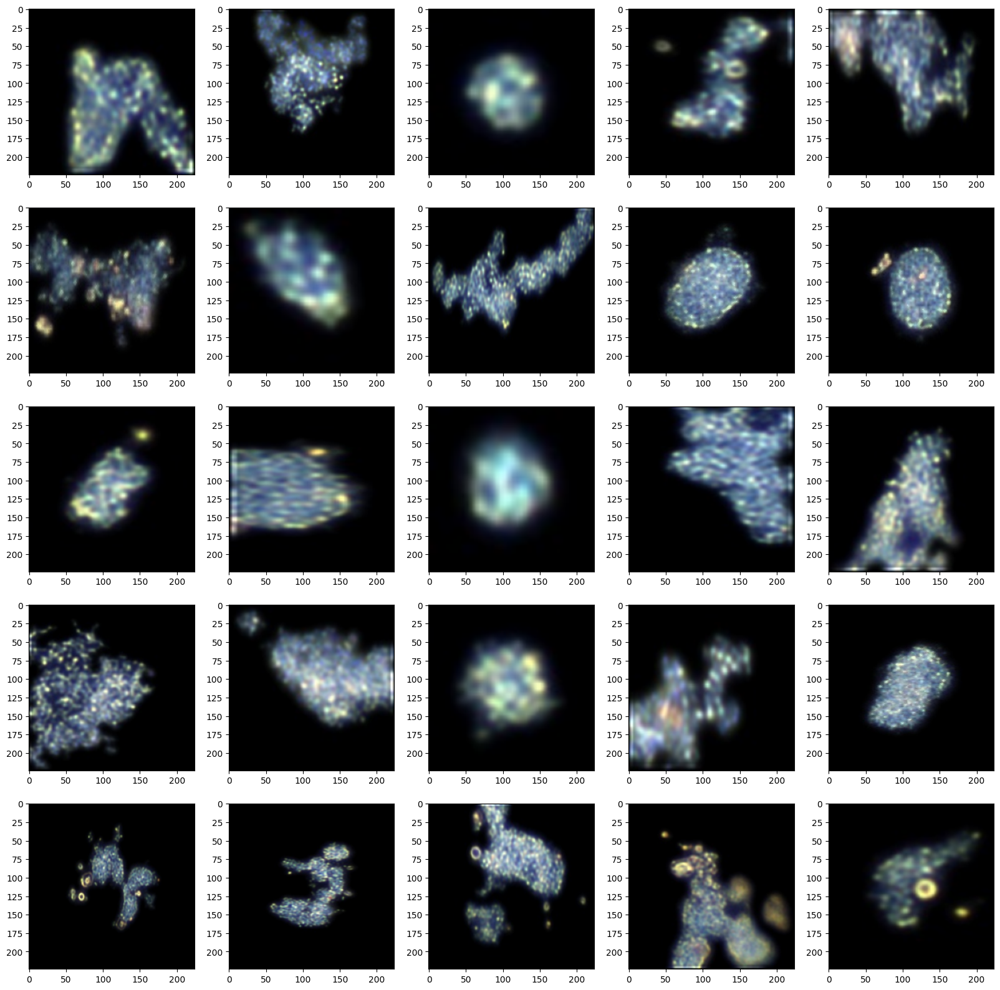

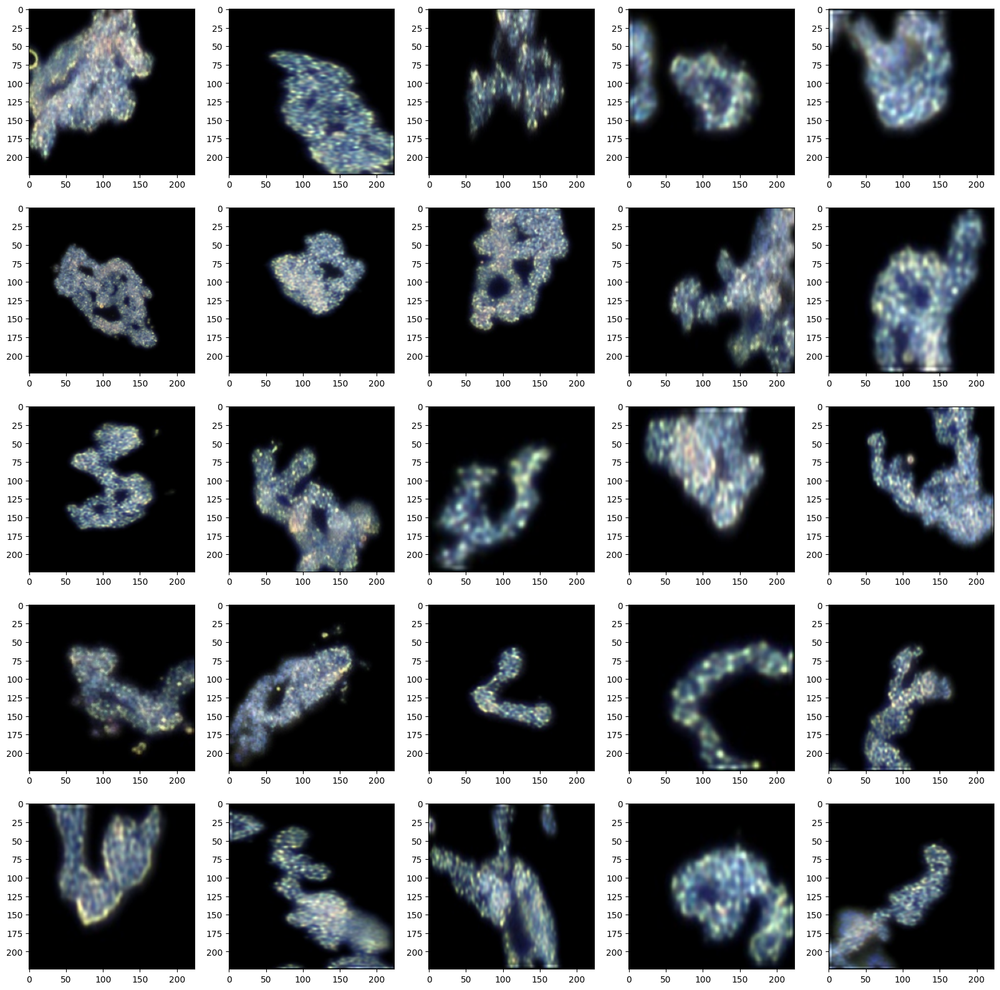

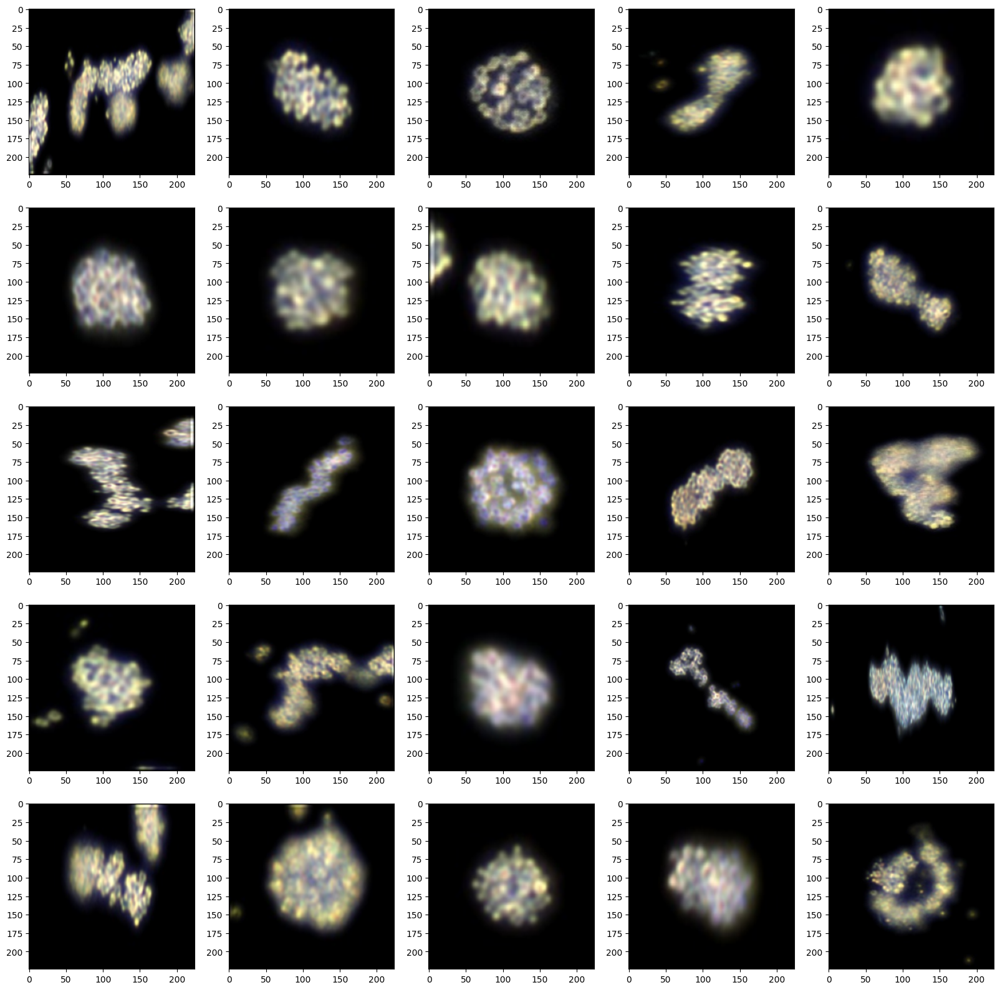

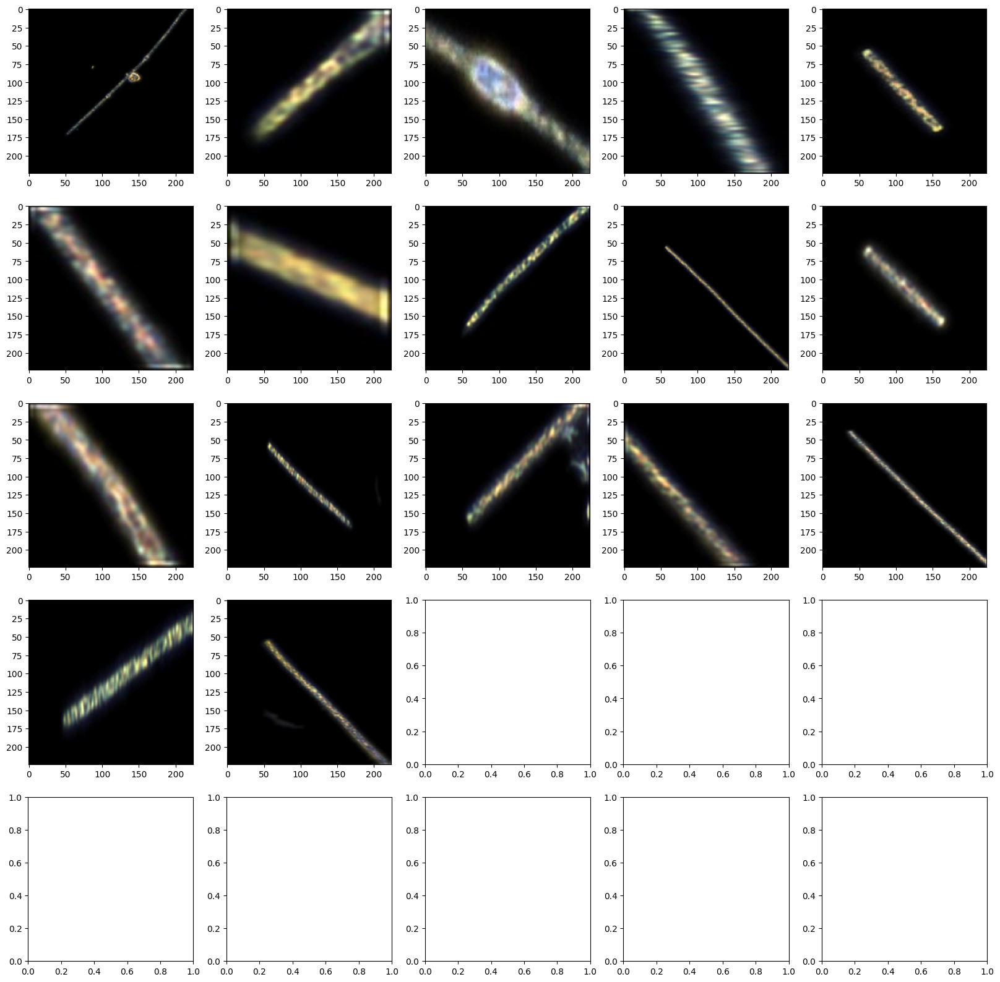

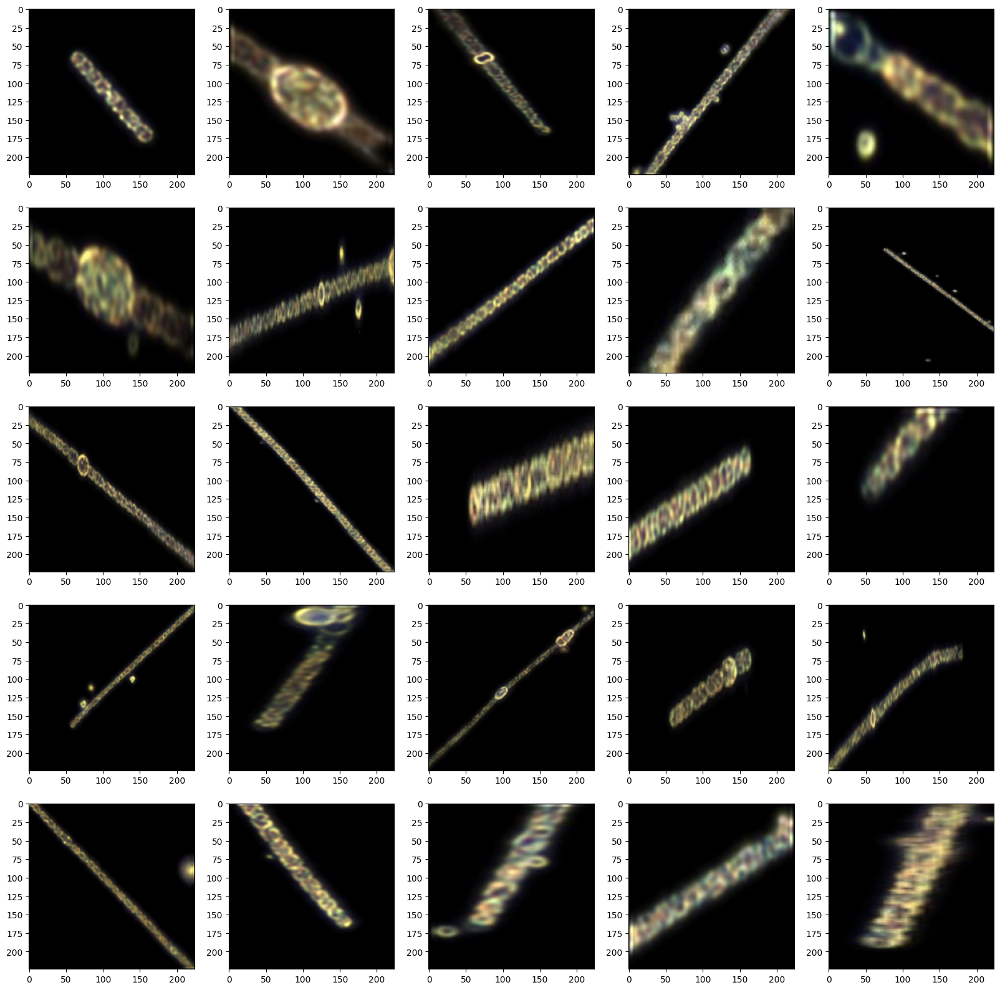

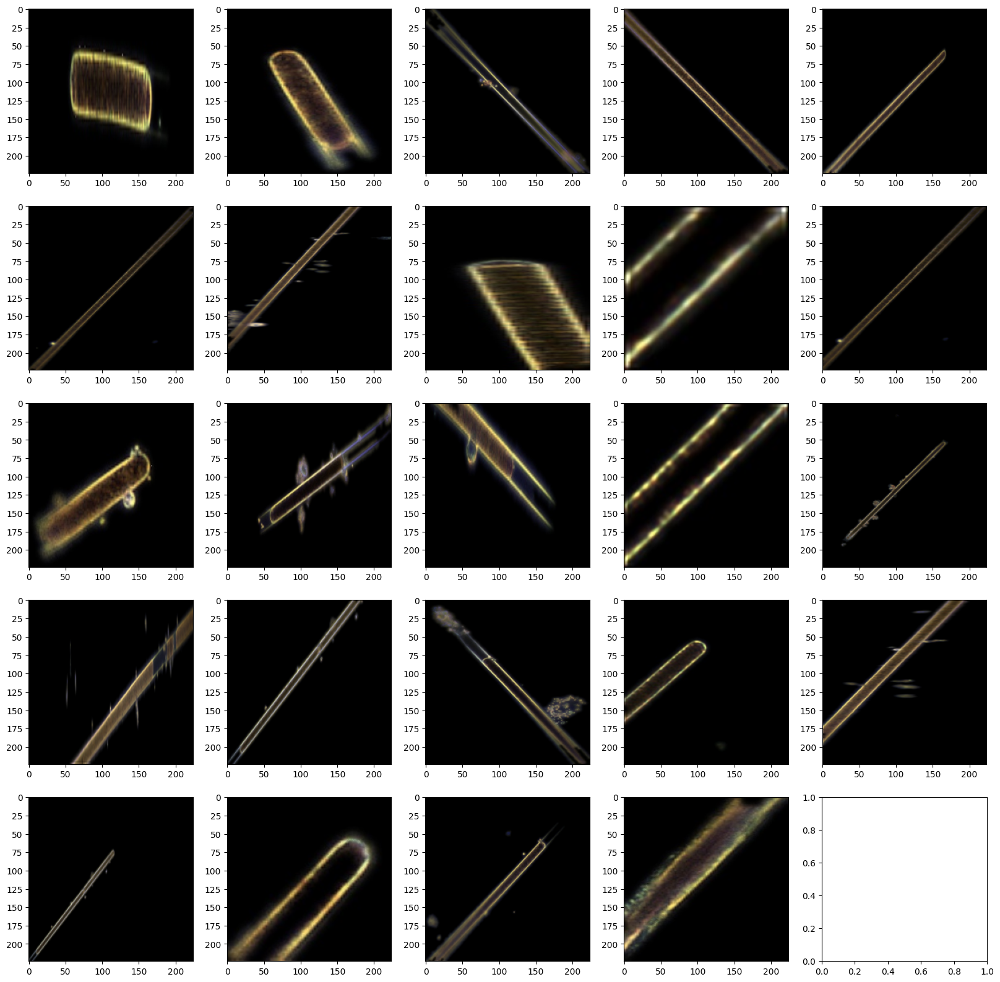

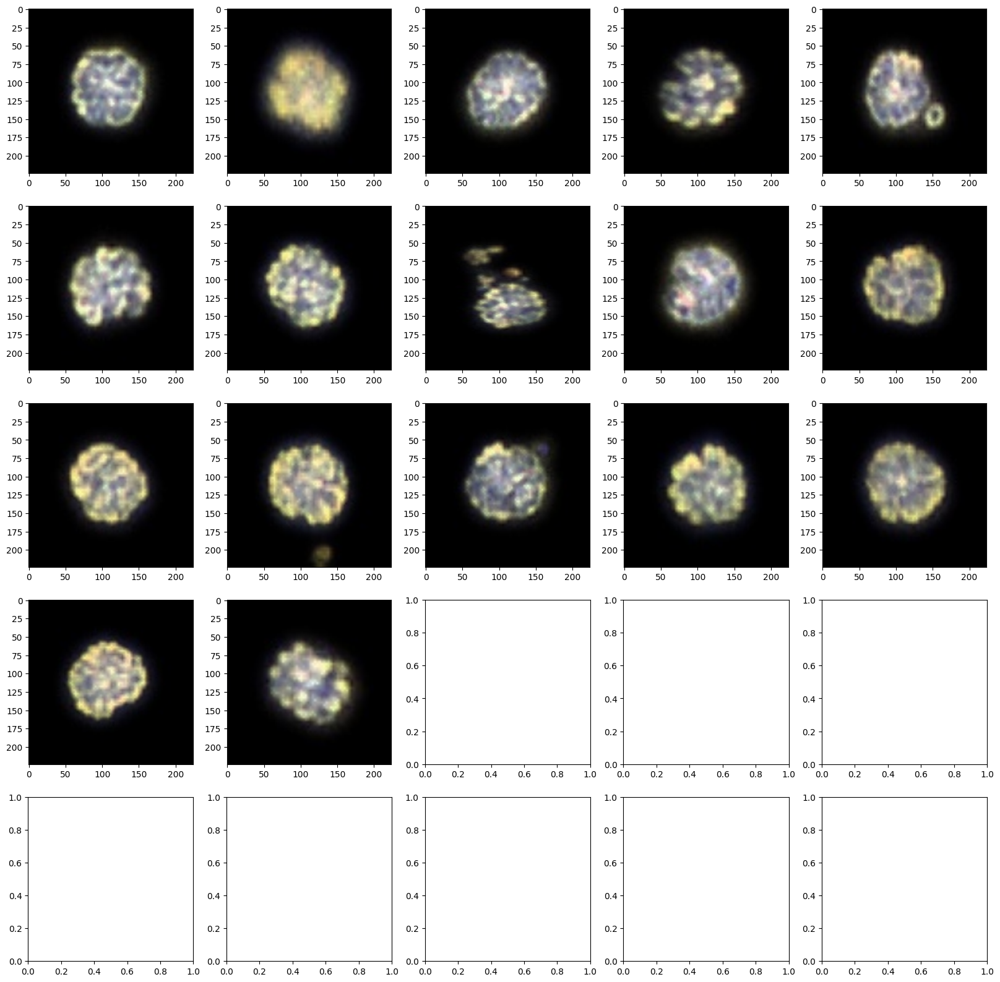

F1 Score:  0.9900323908952198
Accuracy:  0.9903197925669835


In [13]:
%matplotlib inline
import torch
import pytorch_lightning as pl
from lit_plankformer.models.model import Plankformer
from lit_plankformer.data.datamodule import PlanktonDataModule
from torch.utils.data import DataLoader
from scipy.stats import gmean
import numpy as np
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import json
import os
import shutil

# Function to load multiple models
def load_models(model_path, device):

    model = Plankformer.load_from_checkpoint(model_path)
    model.to(device)
    model.eval()

    return model

# Function to prepare the data module
def prepare_data_module(model,name):
    if model.hparams.cyanos_only:
        model.hparams.priority_classes=json.load(open("./lit_plankformer/data/" + 'priority.json'))["priority_classes"]
    model.hparams.dataset = name
    model.hparams.TTA = True
    model.hparams.testing = True
    model.hparams.split =[0,0]
    datamodule = PlanktonDataModule(**(model.hparams), use_multi=False)
    datamodule.setup('fit')
    model.load_datamodule(datamodule)
    return datamodule

# Function for inference with ensemble
def ensemble_inference(model, dataloader, device,name):

    class_map =  model.inverted_class_map
    labels=[]
    final_outputs=[]
    classes=list(class_map.values())
    classes.remove("rest")
    ax_dict = {v:plt.subplots(5,5,figsize=(20,20)) for v in classes}
    class_counter = {v:0 for v in classes}
    k=0
    with torch.no_grad():
        inputs_list=[]

        for batch in dataloader:
            outputs_list = []

            if model.hparams.TTA:
                rots = list(batch[0].keys())

                inputs_list.append(batch[0][rots[0]])
                inputs = torch.cat([batch[0][ang] for ang in rots], dim=0).to(device)
                labels.extend(batch[1])


                outputs = model(inputs).softmax(dim=1).cpu()
                outputs = torch.stack(torch.chunk(outputs, len(rots), dim=0))
                outputs_list.extend(outputs)


            final_outputs.append(torch.mean(torch.stack(outputs_list), dim=0))

        predicted_classes = torch.cat(final_outputs).argmax(dim=1)
        inputs_list = torch.cat(inputs_list, dim=0)
        inputs_list=inputs_list[predicted_classes!=0]
        # Iterate over images and save them to corresponding class folders
        try:
            shutil.rmtree(f'out/{name}')
        except:
            pass
        fig,imax = plt.subplots(1,1,figsize=(5,5))

        for j, (image, pred_class) in enumerate(zip(inputs_list, predicted_classes[predicted_classes!=0])):
            class_name = class_map[pred_class.item()]
            save_path = os.path.join("out",name,class_name, f'image_{j}.png')
            os.makedirs(os.path.join("out",name,class_name), exist_ok=True)
            image = denormalize(image.cpu(),)

            imax.imshow(image.numpy())
            try:
                ax_dict[class_name][1][class_counter[class_name]//5,class_counter[class_name]%5].imshow(image.numpy())
                class_counter[class_name]+=1
            except IndexError:
                print("max images reached")
            fig.savefig(save_path)
            plt.close(fig)
    for key,ax in ax_dict.items():
        save_path_scores = os.path.join("out",name, f'{key}.png')
        ax[0].savefig(f"{save_path_scores}")
    plt.show()
    return predicted_classes,labels





# Function to calculate F1 score
def calculates_scores(all_labels, all_preds):
    f1 = f1_score(all_labels, all_preds,average="weighted")
    print("F1 Score: ", f1)
    accuracy = np.mean(np.array(all_labels) == np.array(all_preds))
    print("Accuracy: ", accuracy)
    return f1, accuracy
# Function to denormalize images
def denormalize(tensor):
    mean,std=[0.485, 0.456, 0.406], [0.229, 0.224, 0.225]
    mean = torch.tensor(mean).view(1, 3, 1, 1)
    std = torch.tensor(std).view(1, 3, 1, 1)
    tensor = tensor * std + mean
    return tensor.squeeze(0).permute(1,2,0)
f1s=[]
accs=[]
ckpt="m5i5l8sc"#["911xctua","gsyka9n2"]
model_paths = f'/beegfs/desy/user/kaechben/eawag/train_out/phyto/{ckpt}/checkpoints/best_model_acc_stage2.ckpt'

# Initialize device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
name='phyto'
# Load models
model = load_models(model_paths, device)
datamodule = prepare_data_module(model,name)

# Setup DataLoader for validation
dataloader = datamodule.test_dataloader()
all_preds, all_labels = ensemble_inference(model, dataloader, device,name)

# Calculate F1 Score
f1,acc=calculates_scores(all_labels, all_preds)
f1s.append(f1)
accs.append(acc)
